# Electrodunas

# Importamos librerías

In [4]:
#!pip install yellowbrick
#!pip install pyod

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import table
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.datasets import make_blobs
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn_extra.cluster import KMedoids
from yellowbrick.cluster import KElbowVisualizer
from kneed import KneeLocator

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Cuenta ouliers
def contar_outliers(df):
    numero_de_outliers ={'Columnas':[], 'Numero Outliers':[]}
    for  column in range(df.shape[1]):
        lista_tipo=['float64', 'int64']
        if (df.iloc[:,column]).dtypes in lista_tipo:
            df_data=df.iloc[:,column]
            q1 = df_data.quantile(q=0.25)
            q2 = df_data.quantile(q=0.5)
            q3 = df_data.quantile(q=0.75)
            iqr = q3 - q1
            upper = q3 + 1.5 * iqr
            lower = q1 - 1.5 * iqr
            #Contar número de outliers
            ubicacion_outliers = (df_data<lower) | (df_data>upper)
            numero_outliers = ubicacion_outliers[ubicacion_outliers==True].sum()
            #print(numero_outliers)
            # Agrego suma de outliers por columna
            numero_de_outliers['Columnas'].append(df.columns[column])
            #numero_de_outliers['Columnas']=pd.concat([numero_de_outliers['Columnas'], df.columns[column]],ignore_index=True )
            numero_de_outliers['Numero Outliers'].append(numero_outliers)
            #numero_de_outliers['Numero Outliers']=pd.concat([numero_de_outliers['Numero Outliers'], numero_outliers],ignore_index=True )

    return pd.DataFrame(numero_de_outliers).sort_values('Numero Outliers', ascending=False)

In [3]:
def metricasANS(cluster):
    dbs = davies_bouldin_score(clientes[columnas], cluster)
    chs = calinski_harabasz_score(clientes[columnas], cluster)
    return dbs, chs

# Cargamos los datos

In [4]:
archivos= []
rango = range(1, 31, 1)
for i in rango:
  nombre = "DATOSCLIENTE" + str(i) + '.csv'
  archivos.append(nombre)

for i in range(len(archivos)):
    url= 'https://raw.githubusercontent.com/Pacheco-Carvajal/GPA-Data-ElectroDunas/main/' + archivos[i]
    temp = pd.read_csv(url)
    temp['idCliente'] = i + 1
    if i == 0:
      clientes = temp.copy()
    else:
      clientes = pd.concat([clientes, temp])
clientes

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,idCliente
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,1
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,1
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,1
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,1
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,1
...,...,...,...,...,...,...
11410,2022-04-21 10:00:00,0.960105,0.473234,1273.150602,1027.084539,30
11411,2022-04-21 11:00:00,0.624300,0.699936,1063.524968,1205.829819,30
11412,2022-04-21 12:00:00,0.985633,0.123560,1207.284283,1127.893714,30
11413,2022-04-21 13:00:00,0.710436,0.399262,1205.012971,1090.835898,30


# Transformamos los datos

In [5]:
clientes['Fecha'] = pd.to_datetime(clientes['Fecha'])
clientes['Fecha2'] = clientes['Fecha'].dt.date
clientes['Dia'] = clientes['Fecha'].dt.day
clientes['Mes'] = clientes['Fecha'].dt.month
clientes['Año'] = clientes['Fecha'].dt.year
clientes['Hora'] = clientes['Fecha'].dt.hour
clientes['Minuto'] = clientes['Fecha'].dt.minute
clientes['Año_Mes'] = clientes['Fecha'].dt.to_period('M')
clientes = clientes[~(clientes['Año_Mes'] == '2023-04')]
clientes.head()

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,idCliente,Fecha2,Dia,Mes,Año,Hora,Minuto,Año_Mes
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,1,2021-01-01,1,1,2021,0,0,2021-01
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,1,2021-01-01,1,1,2021,1,0,2021-01
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,1,2021-01-01,1,1,2021,2,0,2021-01
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,1,2021-01-01,1,1,2021,3,0,2021-01
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,1,2021-01-01,1,1,2021,4,0,2021-01


In [6]:
clientes['FactorPotencia'] = clientes['Active_energy'] / (clientes['Active_energy']**2 + clientes['Reactive_energy']**2)**(1/2)
clientes = clientes.fillna(0)
clientes.head()

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,idCliente,Fecha2,Dia,Mes,Año,Hora,Minuto,Año_Mes,FactorPotencia
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,1,2021-01-01,1,1,2021,0,0,2021-01,0.784582
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,1,2021-01-01,1,1,2021,1,0,2021-01,0.653329
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,1,2021-01-01,1,1,2021,2,0,2021-01,0.951274
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,1,2021-01-01,1,1,2021,3,0,2021-01,0.752465
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,1,2021-01-01,1,1,2021,4,0,2021-01,0.916383


In [7]:
clientes.columns.values

array(['Fecha', 'Active_energy', 'Reactive_energy', 'Voltaje_FA',
       'Voltaje_FC', 'idCliente', 'Fecha2', 'Dia', 'Mes', 'Año', 'Hora',
       'Minuto', 'Año_Mes', 'FactorPotencia'], dtype=object)

# Modelo No Supervizado

## DBSCAN

In [8]:
columnas = ['idCliente', 'Dia','Mes', 'Año', 'Hora', 'Minuto', 'FactorPotencia','Voltaje_FA','Voltaje_FC']
dfDBS = clientes[columnas]

distance = []

neigh = NearestNeighbors(n_neighbors = 5)
nbrs = neigh.fit(dfDBS)
distancias, indices = nbrs.kneighbors(dfDBS)
distancias = np.sort(distancias.flatten())
j = np.arange(len(distancias))
knee = KneeLocator(j, distancias, S=1, curve='convex', direction='increasing', interp_method='polynomial')
distance=distancias[knee.knee]

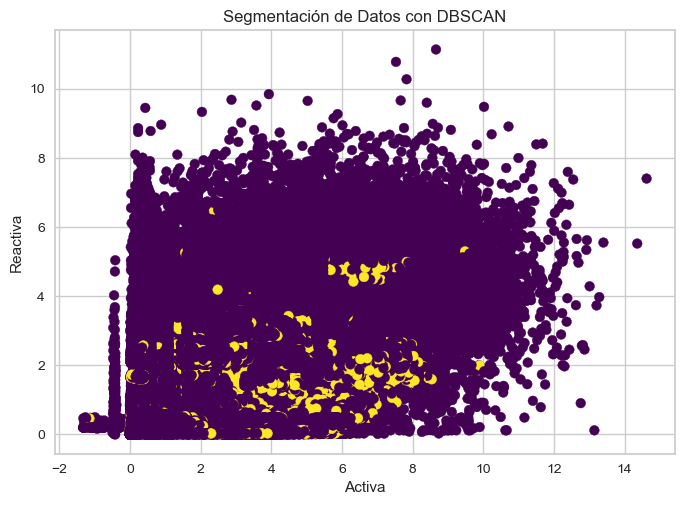

In [9]:
# Aplicamos el algoritmo DBSCAN
dbscan = DBSCAN(eps=distance, min_samples=5,n_jobs=-1)
dfDBS['cluster'] = dbscan.fit_predict(dfDBS)

dfDBS['cluster2'] = dfDBS['cluster'].apply(lambda x: 1 if x < 0 else 0)
dfDBS['Fecha'] = clientes.Fecha2
dfDBS['Activa'] = clientes.Active_energy
dfDBS['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfDBS['Activa'], dfDBS['Reactiva'], c=dfDBS['cluster2'], cmap='viridis')
plt.title('Segmentación de Datos con DBSCAN')
plt.xlabel('Activa')
plt.ylabel('Reactiva')
plt.show()

In [79]:
dfDBS.cluster2.value_counts()

cluster2
0    400091
1     63324
Name: count, dtype: int64

In [78]:
metrica1DBS1, metrica2DBS1 = metricasANS(dfDBS['cluster2'])
print('Davies-Bouldin Index: ' + str(metrica1DBS1))
print('\nCalinski-Harabasz Index: ' + str(metrica2DBS1))

Davies-Bouldin Index: 3.320242661097362

Calinski-Harabasz Index: 18626.360422804635


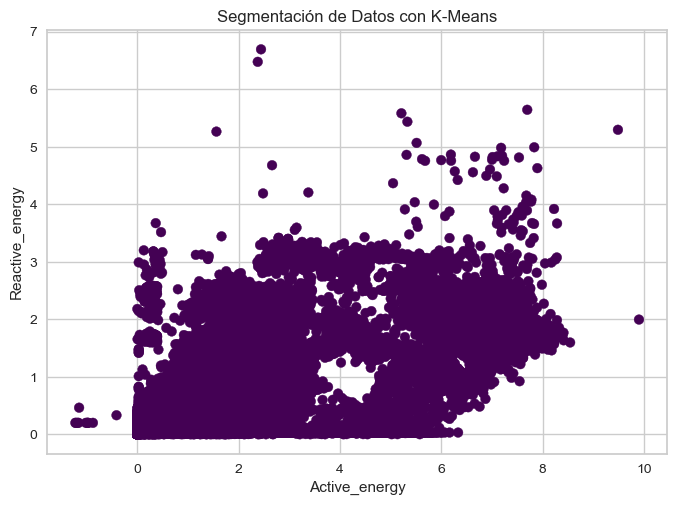

In [100]:
tempdf = dfDBS[dfDBS.cluster2==1]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con K-Means')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

## K-means

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


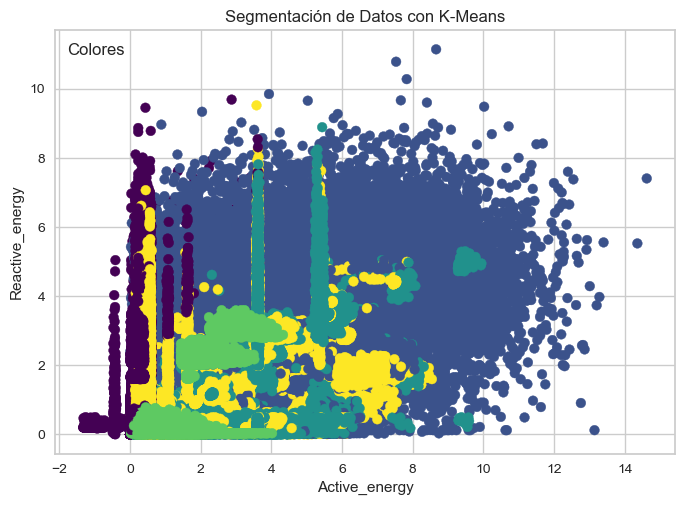

In [49]:
dfKm = clientes[columnas]

scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfKm)

# Número de clústeres
num_clusters = 5

# Aplicamos el algoritmo K-Means
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
dfKm['cluster'] = kmeans.fit_predict(df_scaled)
dfKm['cluster2'] = dfKm['cluster'].apply(lambda x: 1 if x == 0 else 0)
dfKm['Activa'] = clientes.Active_energy
dfKm['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfKm['Activa'], dfKm['Reactiva'], c=dfKm['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con K-Means')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.legend(loc='upper left', title='Colores')
plt.show()

In [50]:
dfKm.cluster.value_counts()

cluster
1    149175
2    103173
4    101027
0     59236
3     50804
Name: count, dtype: int64

In [52]:
metrica1Km, metrica2Km = metricasANS(dfKm['cluster2'])
print('Davies-Bouldin Index: ' + str(metrica1Km))
print('\nCalinski-Harabasz Index: ' + str(metrica2Km))

Davies-Bouldin Index: 2.5883053059021393

Calinski-Harabasz Index: 15434.692350331949


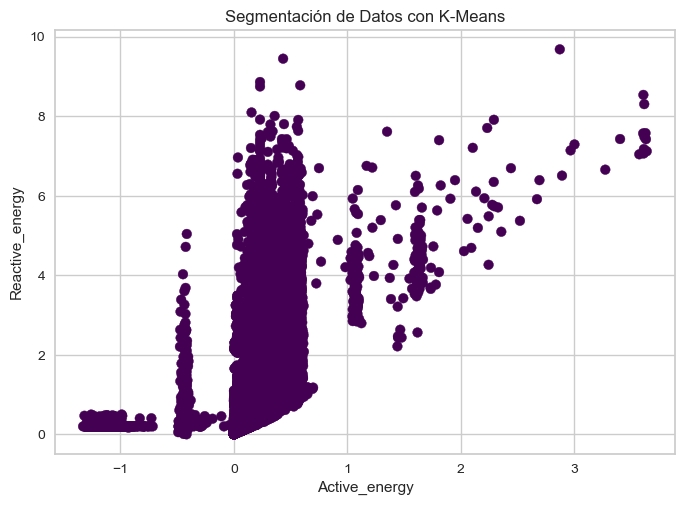

In [51]:
tempdf = dfKm[dfKm.cluster==0]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con K-Means')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

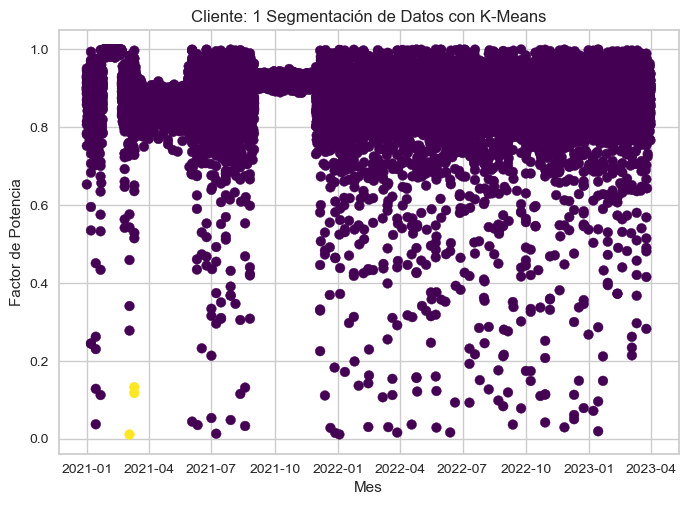

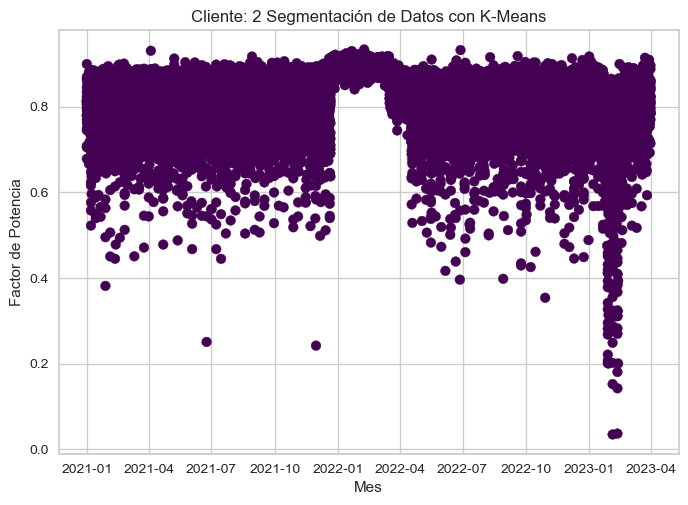

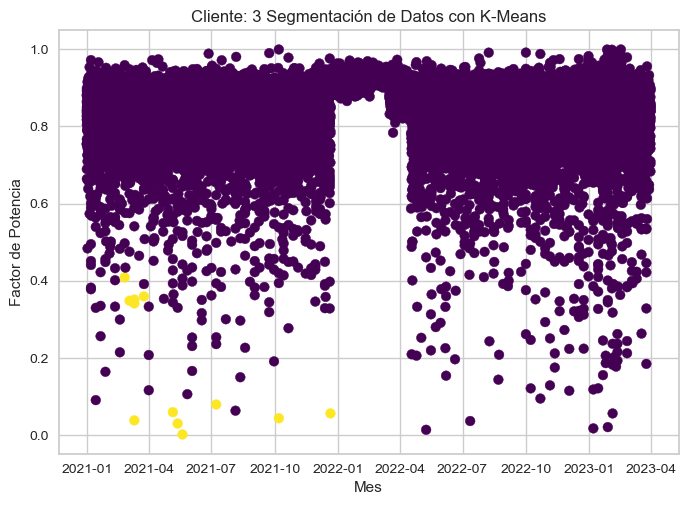

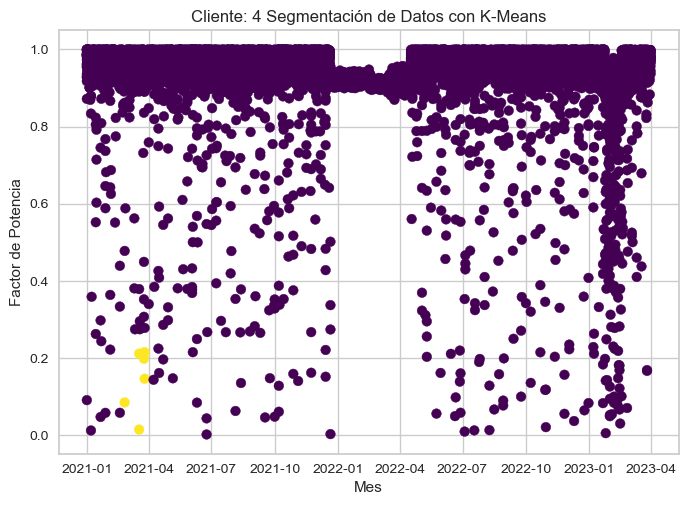

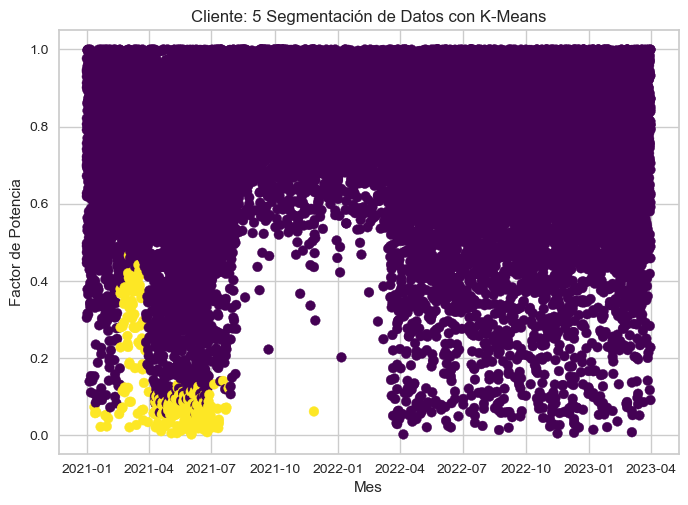

...

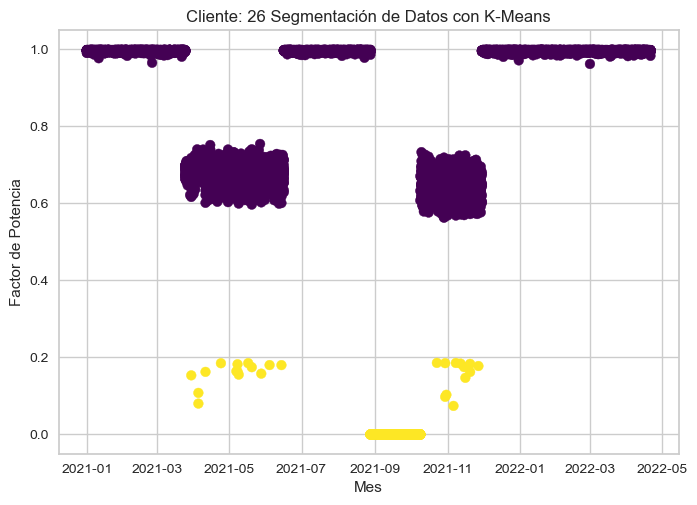

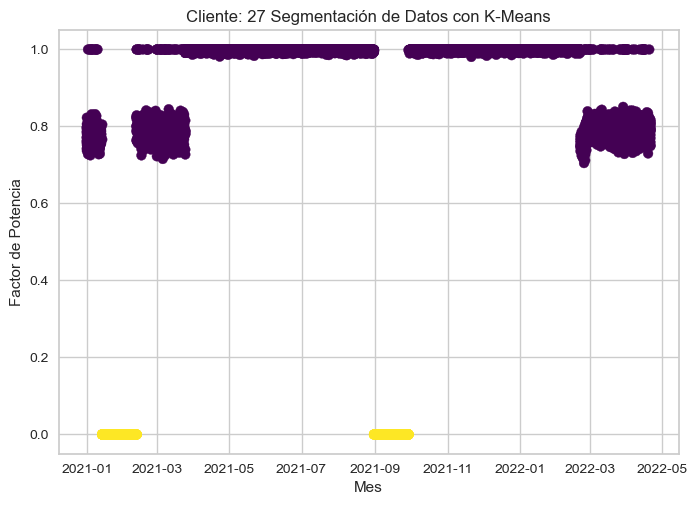

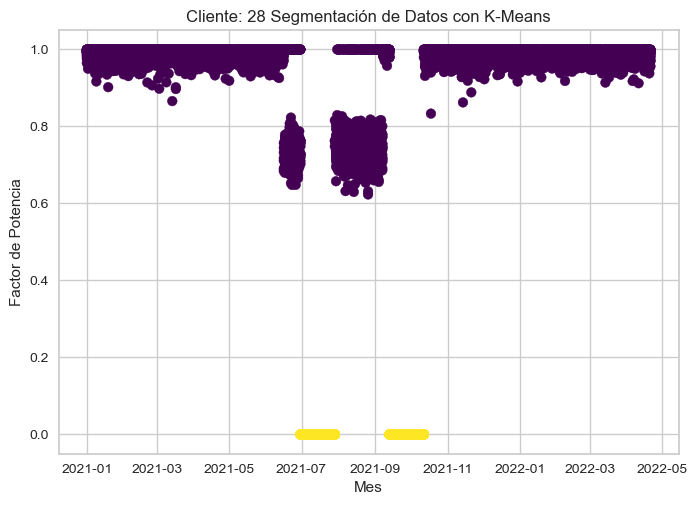

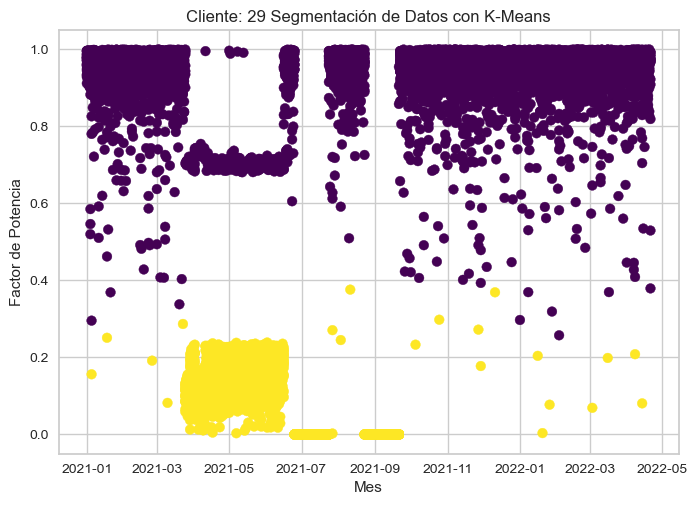

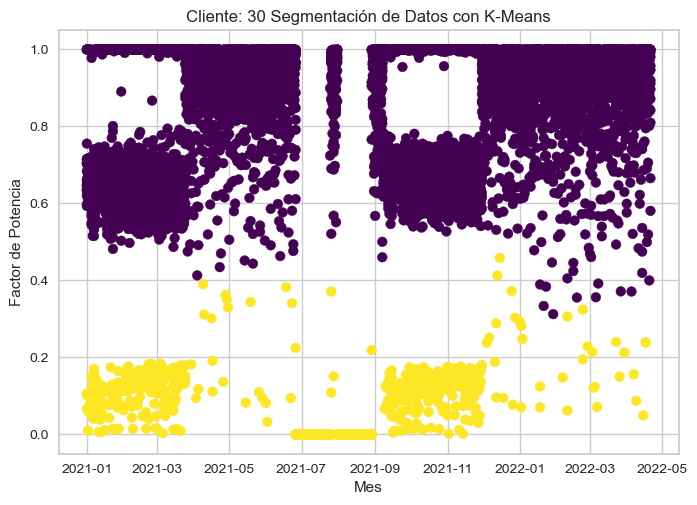

In [115]:
dfKm['Fecha'] = clientes.Fecha2

# Visualizamos los resultados
for i in range(1,31):
    tempdf = dfKm[dfKm.idCliente == i]
    plt.scatter(tempdf['Fecha'], tempdf['FactorPotencia'], c=tempdf['cluster2'], cmap='viridis')
    plt.title("Cliente: "+ str(i) + ' Segmentación de Datos con K-Means')
    plt.xlabel('Mes')
    plt.ylabel('Factor de Potencia')
    plt.show()

## K-means con PCA

Varianza explicada por cada componente principal: [0.28248978 0.1700092  0.12708319]


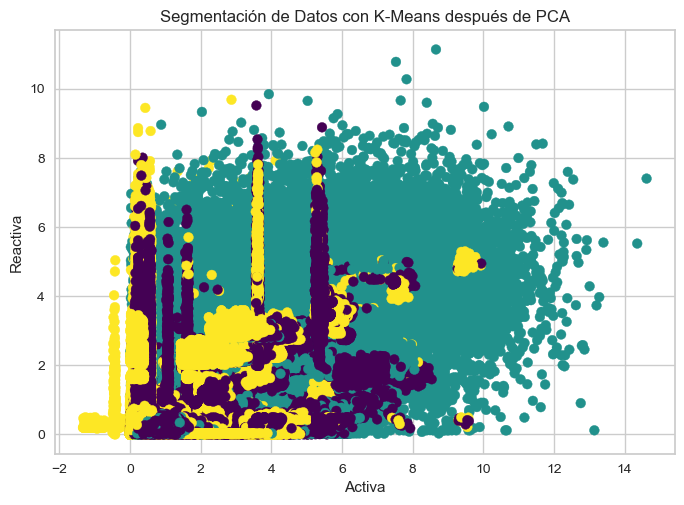

In [60]:
dfKPCA = clientes[columnas]

scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfKPCA)

# Aplicamos PCA para reducción de dimensionalidad
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)

# Visualizamos la varianza explicada por cada componente principal
print("Varianza explicada por cada componente principal:", pca.explained_variance_ratio_)

# Aplicamos el algoritmo K-Means en las componentes principales
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
dfKPCA['cluster'] = kmeans.fit_predict(df_pca)
dfKPCA['Activa'] = clientes.Active_energy
dfKPCA['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfKPCA['Activa'],dfKPCA['Reactiva'], c=dfKPCA['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con K-Means después de PCA')
plt.xlabel('Activa')
plt.ylabel('Reactiva')
plt.show()

In [61]:
dfKPCA.cluster.value_counts()

cluster
2    171855
1    159845
0    131715
Name: count, dtype: int64

In [62]:
metrica1KPCA, metrica2KPCA = metricasANS(dfKPCA['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1KPCA))
print('\nCalinski-Harabasz Index: ' + str(metrica2KPCA))

Davies-Bouldin Index: 1.4645001263138797

Calinski-Harabasz Index: 449824.92045027873


## Detección de outliers con KNN

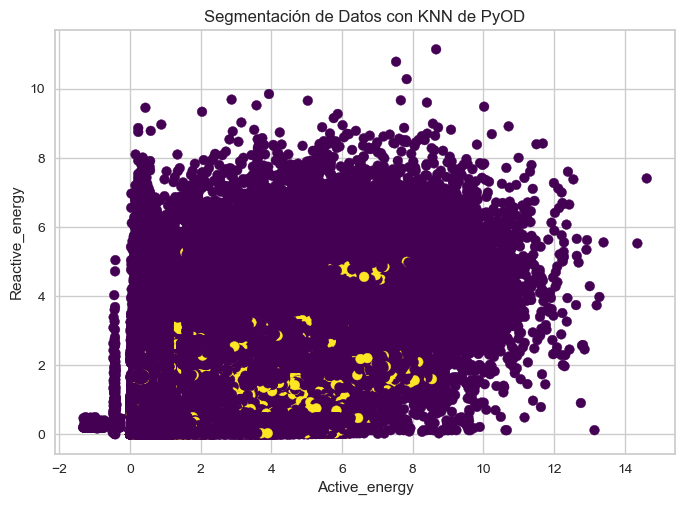

In [109]:
dfPyOD = clientes[columnas]

from pyod.models.knn import KNN

clf = KNN()
clf.fit(dfPyOD)
y_pred = clf.predict(dfPyOD)
dfPyOD['cluster'] = y_pred
dfPyOD['Activa'] = clientes.Active_energy
dfPyOD['Reactiva'] = clientes.Reactive_energy
plt.scatter(dfPyOD['Activa'], dfPyOD['Reactiva'], c=dfPyOD['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con KNN de PyOD')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

In [110]:
dfPyOD.cluster.value_counts()

cluster
0    425065
1     38350
Name: count, dtype: int64

In [111]:
metrica1PyOD, metrica2PyOD = metricasANS(dfPyOD['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1PyOD))
print('\nCalinski-Harabasz Index: ' + str(metrica2PyOD))

Davies-Bouldin Index: 3.0590045536345625

Calinski-Harabasz Index: 15309.549066788528


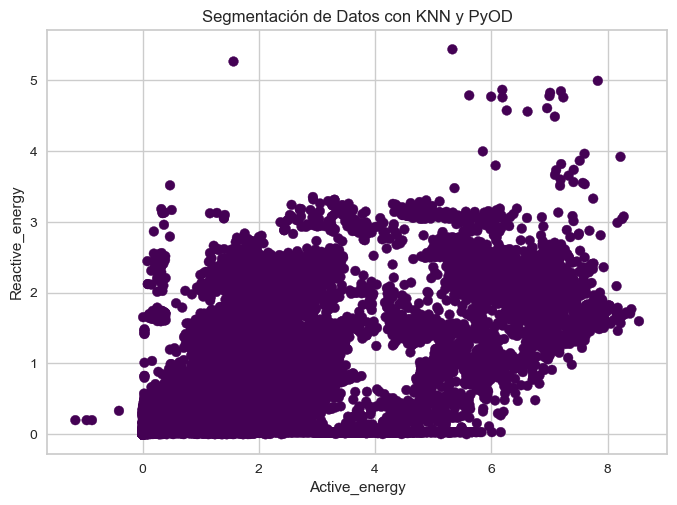

In [116]:
tempdf = dfPyOD[dfPyOD.cluster==1]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con KNN y PyOD')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

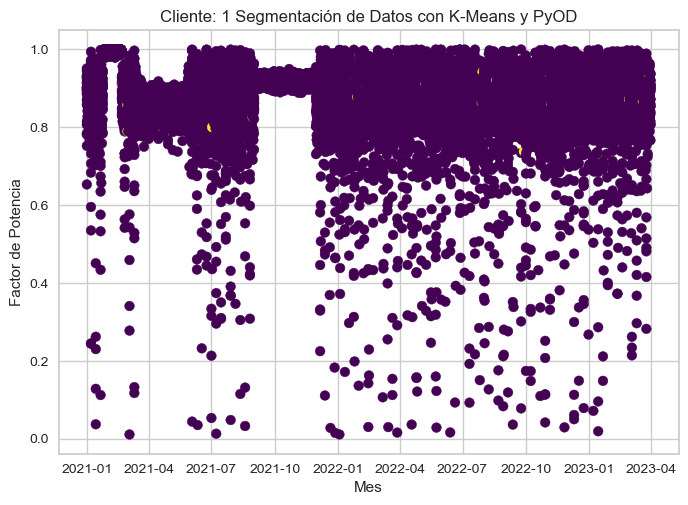

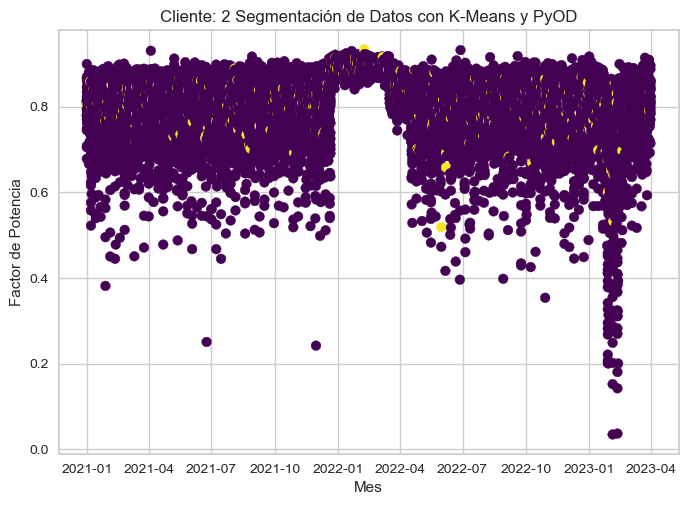

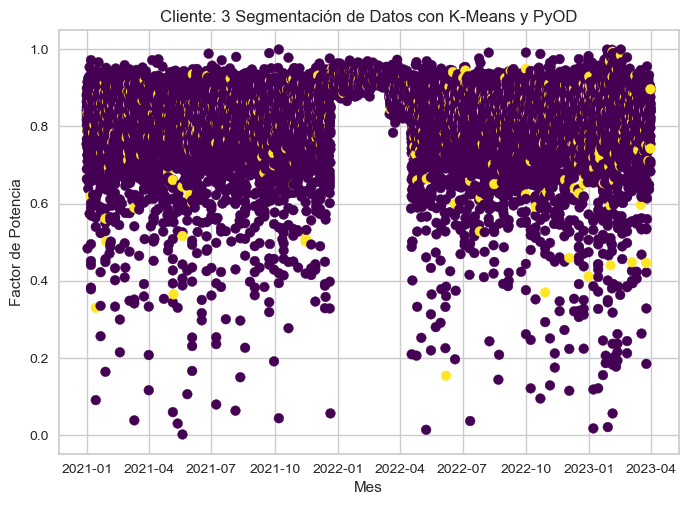

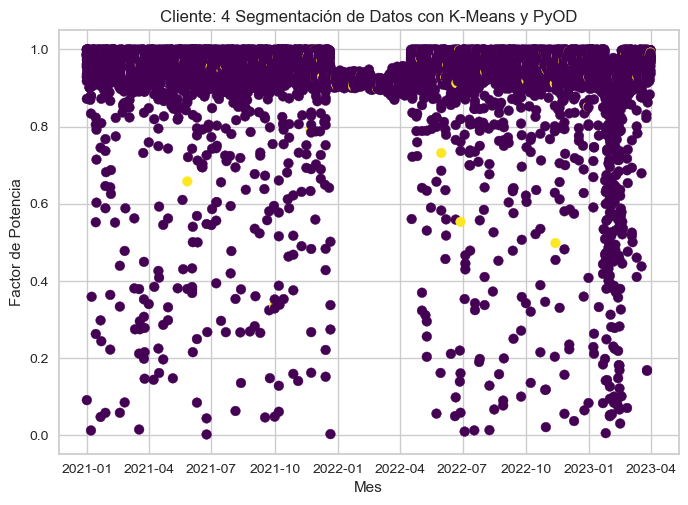

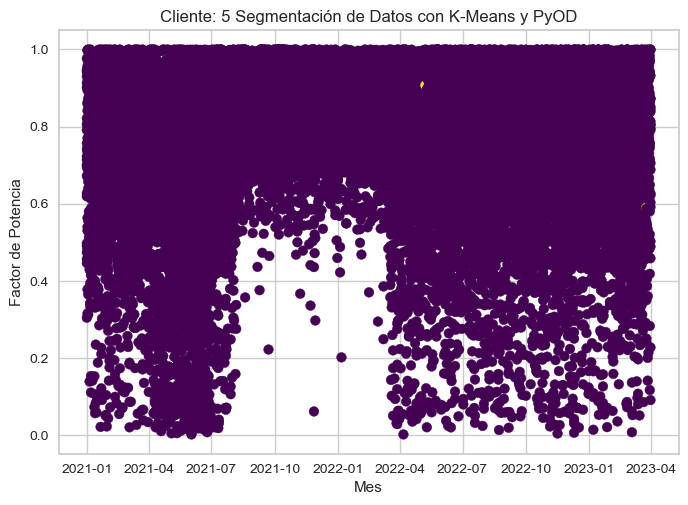

...

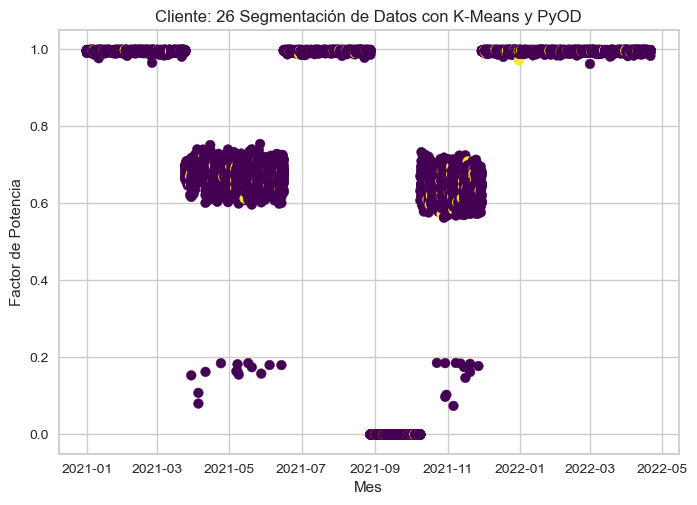

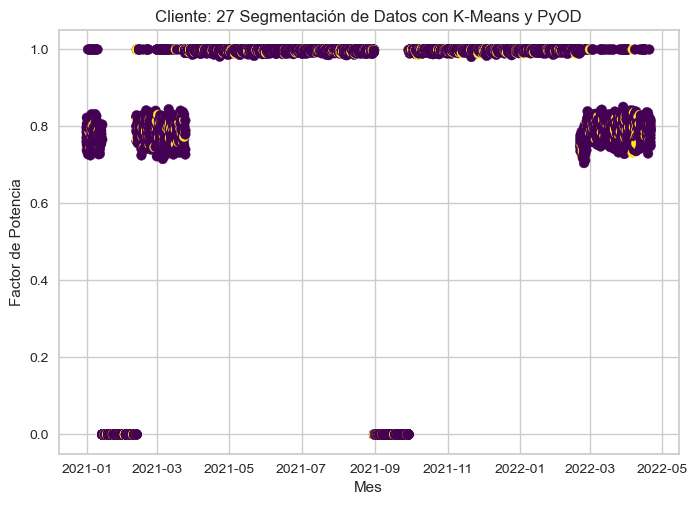

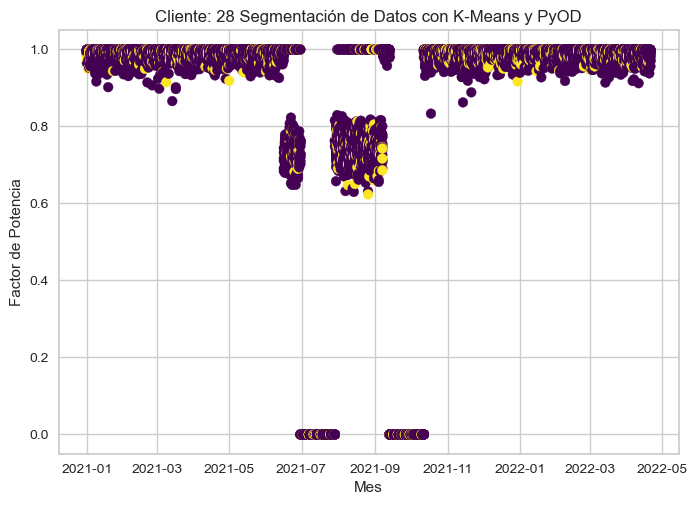

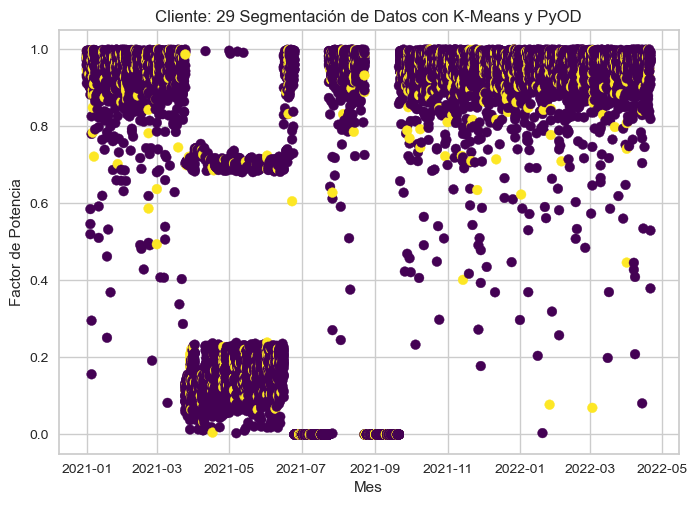

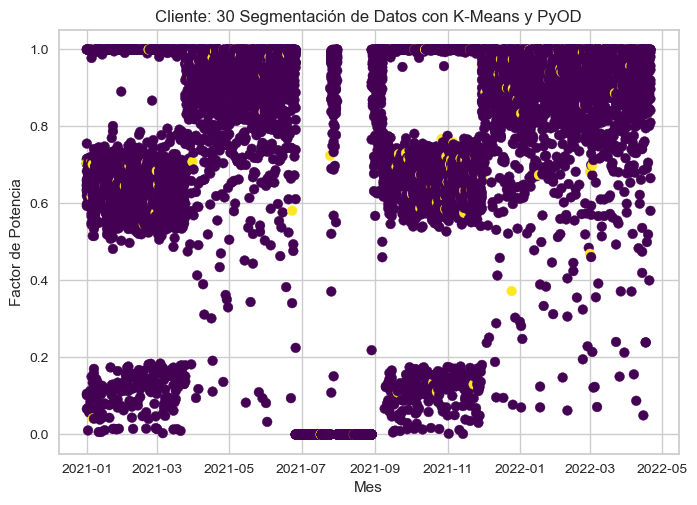

In [119]:
dfPyOD['Fecha'] = clientes.Fecha2

# Visualizamos los resultados
for i in range(1,31):
    tempdf = dfPyOD[dfPyOD.idCliente == i]
    plt.scatter(tempdf['Fecha'], tempdf['FactorPotencia'], c=tempdf['cluster'], cmap='viridis')
    plt.title("Cliente: "+ str(i) + ' Segmentación de Datos con KNN y PyOD')
    plt.xlabel('Mes')
    plt.ylabel('Factor de Potencia')
    plt.show()

## Isolation Forest

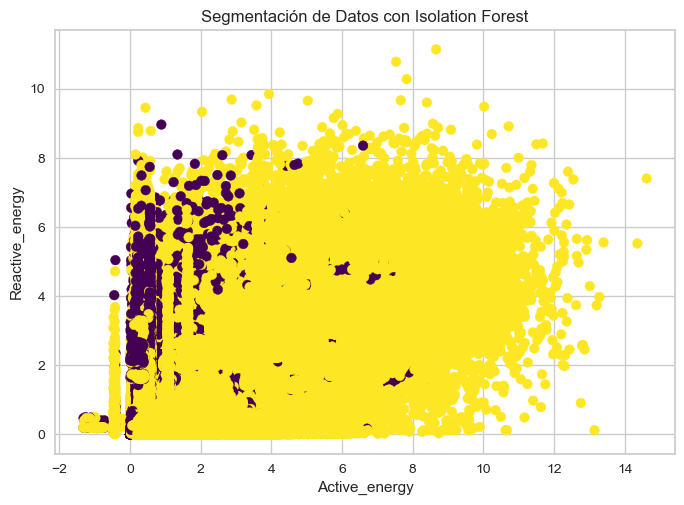

In [107]:
dfIF = clientes[columnas]
clfIF = IsolationForest(contamination=0.05, random_state=42, n_jobs=-1)
clfIF.fit(df)
dfIF['cluster'] = clfIF.predict(dfIF)
dfIF['Activa'] = clientes.Active_energy
dfIF['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfIF['Activa'], dfIF['Reactiva'], c=dfIF['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con Isolation Forest')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

In [102]:
dfIF.cluster.value_counts()

cluster
 1    440244
-1     23171
Name: count, dtype: int64

In [103]:
metrica1IF1, metrica2IF1 = metricasANS(dfIF['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1IF1))
print('\nCalinski-Harabasz Index: ' + str(metrica2IF1))

Davies-Bouldin Index: 3.742333977994088

Calinski-Harabasz Index: 8703.982892902472


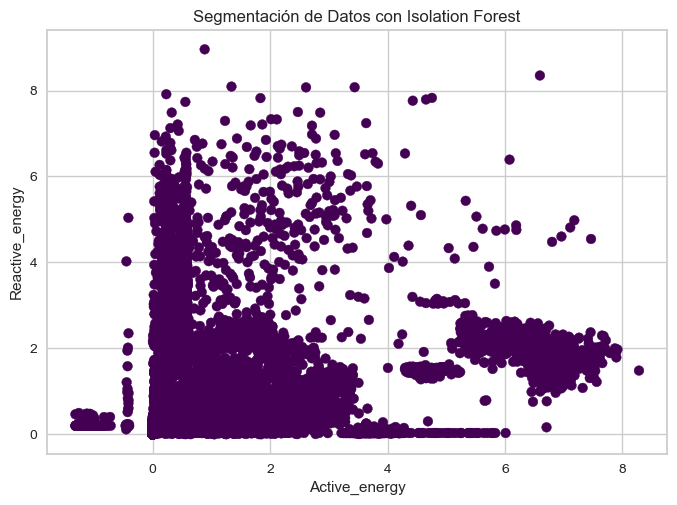

In [106]:
tempdf = dfIF[dfIF.cluster==-1]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con Isolation Forest')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

# Modelos No Supervisado por cliente

## DBSCAN por cliente

In [69]:
df = clientes[columnas]

distance = []
for i in df.idCliente.unique():
    df2 = df[df.idCliente==i][columnas].copy()
    neigh = NearestNeighbors(n_neighbors = 5)
    nbrs = neigh.fit(df2)
    distancias, indices = nbrs.kneighbors(df2)
    distancias = np.sort(distancias.flatten())
    j = np.arange(len(distancias))
    knee = KneeLocator(j, distancias, S=1, curve='convex', direction='increasing', interp_method='polynomial')
    distance.append(distancias[knee.knee])

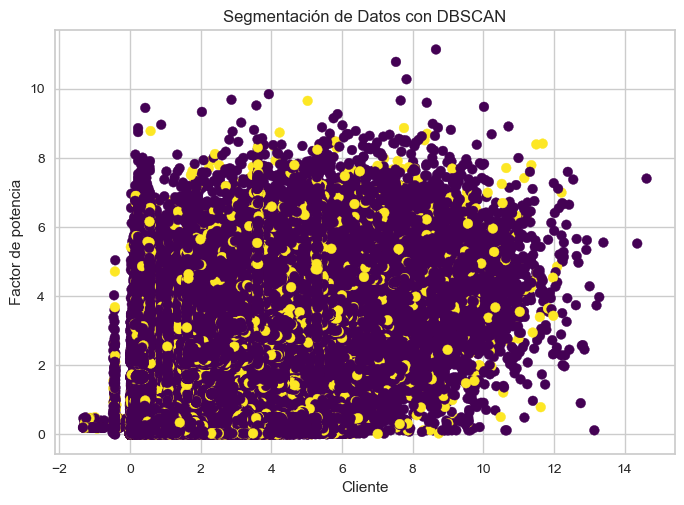

In [70]:
j=0
# Aplicamos el algoritmo DBSCAN
for i in df.idCliente.unique():
    if i ==1:
        df2 = df[df.idCliente==i][columnas].copy()
        #scaler = StandardScaler()
        #df_scaled = scaler.fit_transform(df2)
        dbscan = DBSCAN(eps=distance[j], min_samples=5,n_jobs=-1)
        df2['cluster'] = dbscan.fit_predict(df2)
        df3 = df2.copy()
    else:
        df2 = df[df.idCliente==i][columnas].copy()
        #scaler = StandardScaler()
        #df_scaled = scaler.fit_transform(df2)
        dbscan = DBSCAN(eps=distance[j], min_samples=5,n_jobs=-1)
        df2['cluster'] = dbscan.fit_predict(df2)
        df3 = pd.concat([df3,df2])
    j+=1
df3['cluster2'] = df3['cluster'].apply(lambda x: 1 if x < 0 else 0)
df3['Fecha'] = clientes.Fecha2
df3['Activa'] = clientes.Active_energy
df3['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(df3['Activa'], df3['Reactiva'], c=df3['cluster2'], cmap='viridis')
plt.title('Segmentación de Datos con DBSCAN')
plt.xlabel('Cliente')
plt.ylabel('Factor de potencia')
plt.show()

In [71]:
df3.cluster2.value_counts()

cluster2
0    403622
1     59793
Name: count, dtype: int64

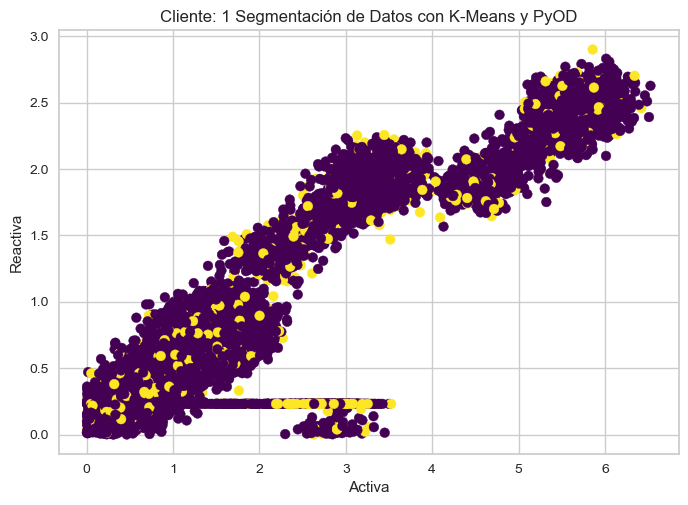

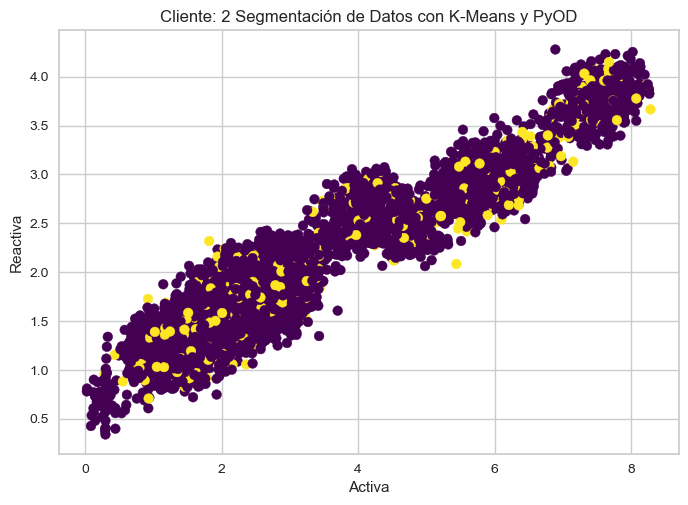

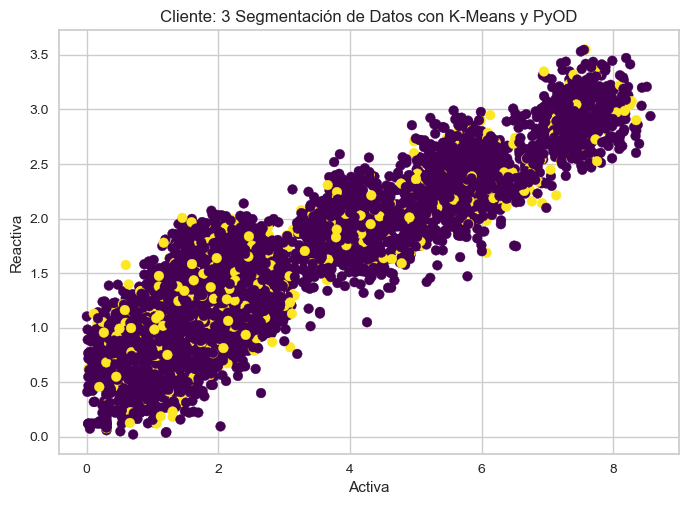

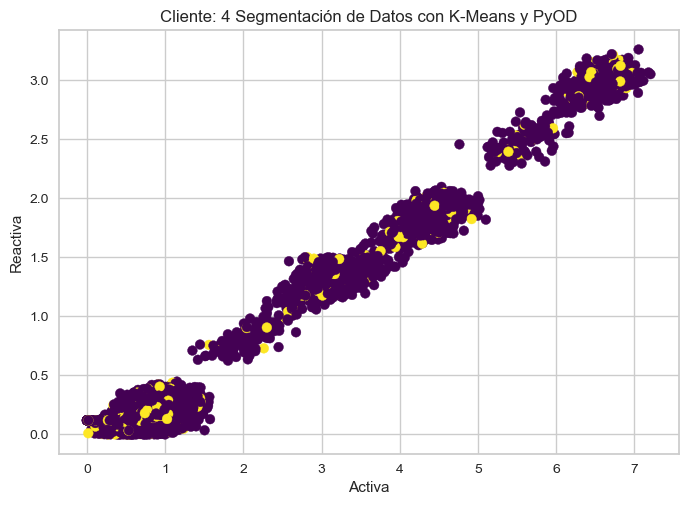

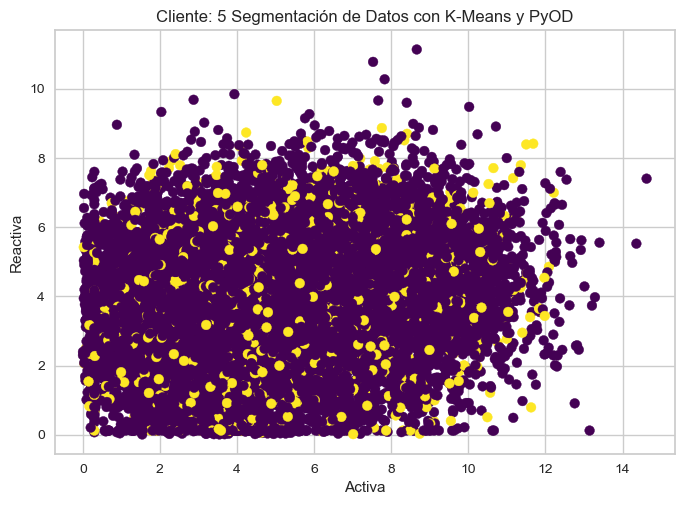

...

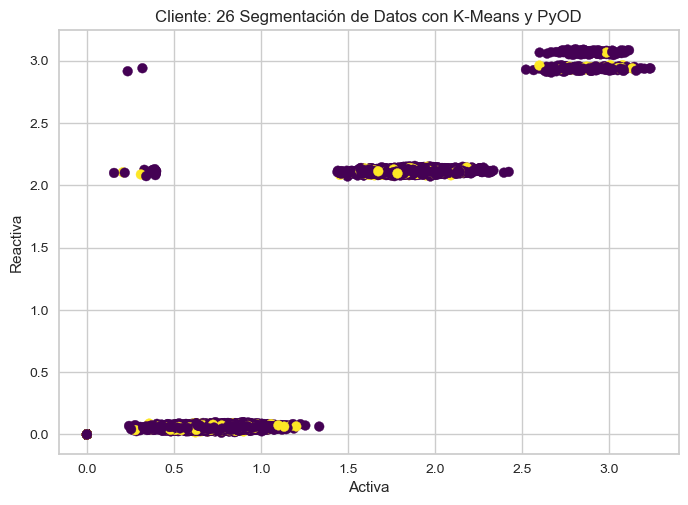

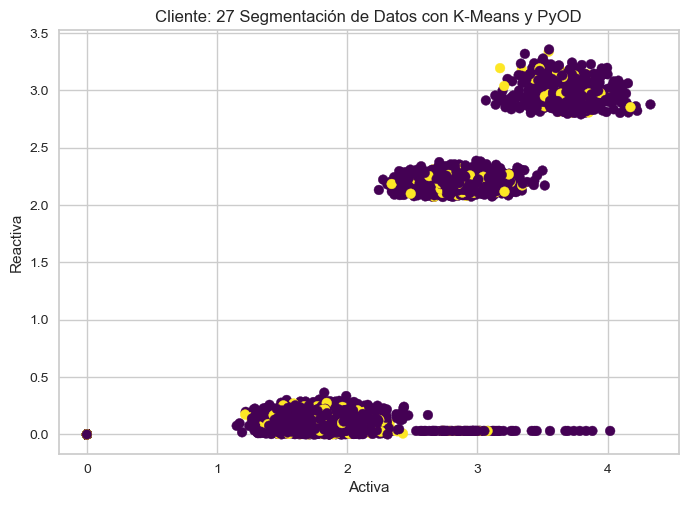

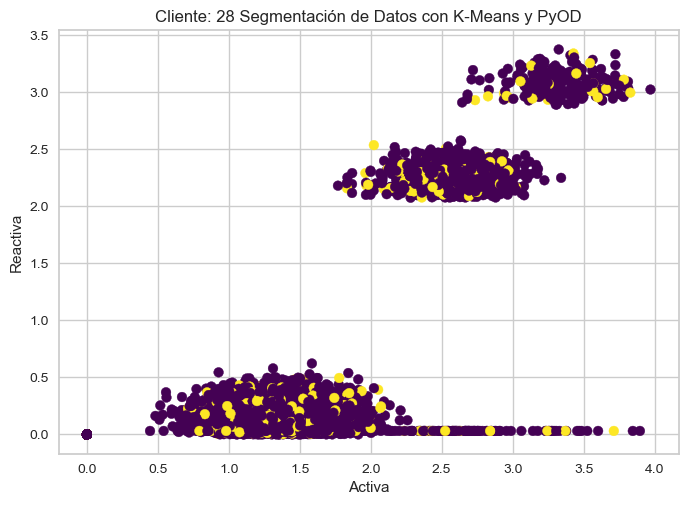

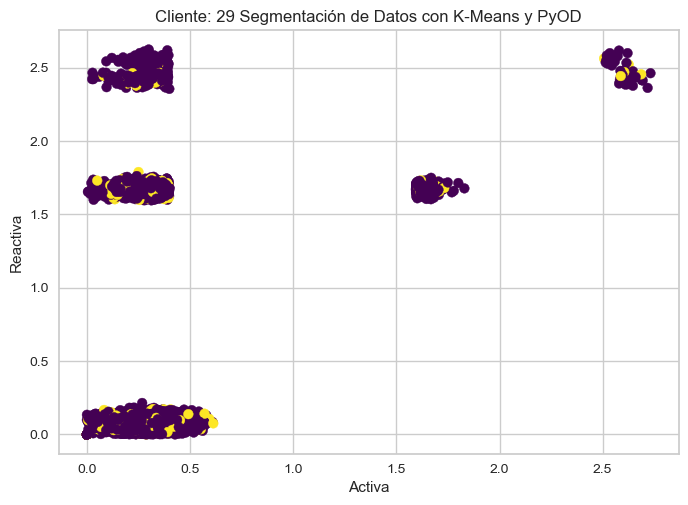

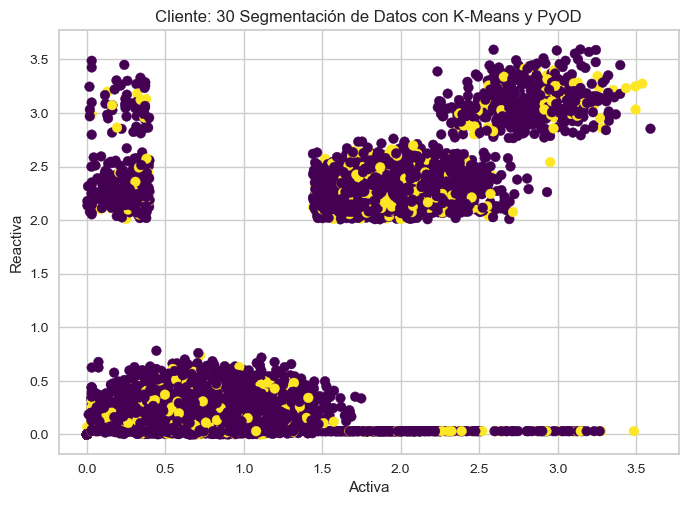

In [72]:
# Visualizamos los resultados
df3['cluster2'] = df3['cluster'].apply(lambda x: 1 if x < 0 else 0)
df3['Fecha'] = clientes.Fecha2
df3['Activa'] = clientes.Active_energy
df3['Reactiva'] = clientes.Reactive_energy
for i in range(1,31):
    tempdf = df3[df3.idCliente == i]
    plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster2'], cmap='viridis')
    plt.title("Cliente: "+ str(i) + ' Segmentación de Datos con K-Means y PyOD')
    plt.xlabel('Activa')
    plt.ylabel('Reactiva')
    plt.show()

In [73]:
metrica1DBS, metrica2DBS = metricasANS(df3['cluster2'])
print('Davies-Bouldin Index: ' + str(metrica1DBS))
print('\nCalinski-Harabasz Index: ' + str(metrica2DBS))

Davies-Bouldin Index: 8.880961820927322

Calinski-Harabasz Index: 2034.7139473422496


## Isolation Forest por cliente

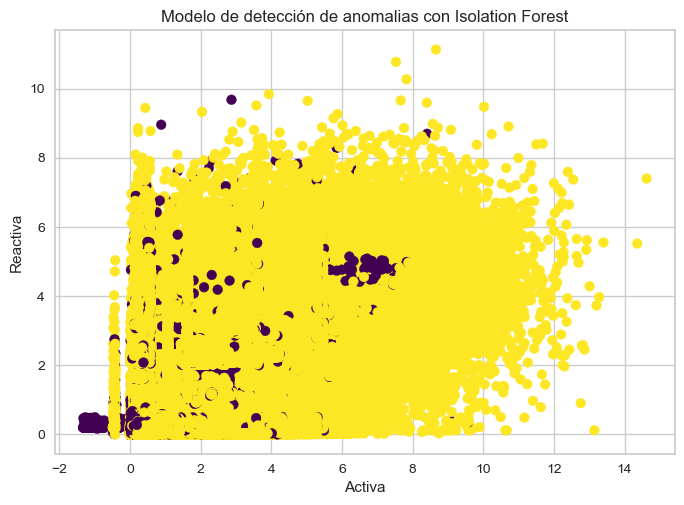

In [65]:
# Crear un modelo Isolation Forest para cada cliente
    
df = clientes[columnas]

for i in df.idCliente.unique():
    if i ==1:
        df2 = df[df.idCliente==i].copy()
        clfIF = IsolationForest(contamination=0.05, random_state=42)
        clfIF.fit(df2)
        df2['cluster'] = clfIF.predict(df2)
        dfIF = df2.copy()
    else:
        df2 = df[df.idCliente==i].copy()
        clfIF = IsolationForest(contamination=0.05, random_state=42)
        clfIF.fit(df2)
        df2['cluster'] = clfIF.predict(df2)
        dfIF = pd.concat([dfIF,df2])

dfIF['Fecha'] = clientes.Fecha2
dfIF['Activa'] = clientes.Active_energy
dfIF['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfIF['Activa'], dfIF['Reactiva'], c=dfIF['cluster'], cmap='viridis')
plt.title('Modelo de detección de anomalias con Isolation Forest')
plt.xlabel('Activa')
plt.ylabel('Reactiva')
plt.show()

In [66]:
dfIF.cluster.value_counts()

cluster
 1    440239
-1     23176
Name: count, dtype: int64

In [67]:
metrica1IF2, metrica2IF2 = metricasANS(dfIF['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1IF2))
print('\nCalinski-Harabasz Index: ' + str(metrica2IF2))

Davies-Bouldin Index: 5.338761051654076

Calinski-Harabasz Index: 2307.084720367065


## K-Means por cliente

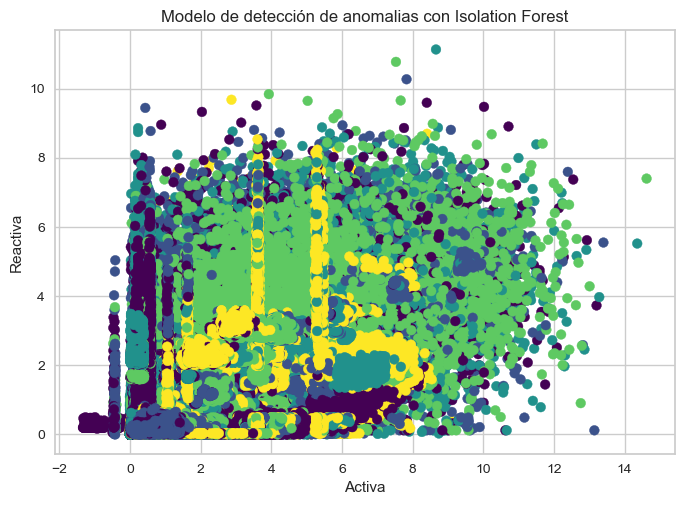

In [80]:
df = clientes[columnas]

# Número de clústeres
num_clusters = 5

for i in df.idCliente.unique():
    if i ==1:
        df2 = df[df.idCliente==i].copy()
        scaler = StandardScaler()
        df_scaled = scaler.fit_transform(df2)
        kmeans = KMeans(n_clusters=num_clusters, random_state=0)
        df2['cluster'] = kmeans.fit_predict(df_scaled)
        dfKm2 = df2.copy()
    else:
        df2 = df[df.idCliente==i].copy()
        scaler = StandardScaler()
        df_scaled = scaler.fit_transform(df2)
        kmeans = KMeans(n_clusters=num_clusters, random_state=0)
        df2['cluster'] = kmeans.fit_predict(df_scaled)
        dfKm2 = pd.concat([dfKm2,df2])

dfKm2['Fecha'] = clientes.Fecha2
dfKm2['Activa'] = clientes.Active_energy
dfKm2['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfKm2['Activa'], dfKm2['Reactiva'], c=dfKm2['cluster'], cmap='viridis')
plt.title('Modelo de detección de anomalias con Isolation Forest')
plt.xlabel('Activa')
plt.ylabel('Reactiva')
plt.show()

In [81]:
dfKm2.cluster.value_counts()

cluster
1    114152
2     96584
4     95590
0     85638
3     71451
Name: count, dtype: int64

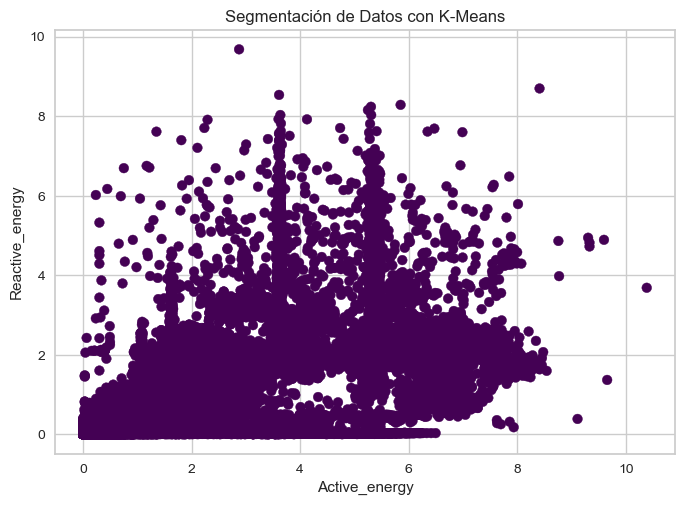

In [87]:
tempdf = dfKm2[dfKm2.cluster==4]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con K-Means')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

In [89]:
metrica1Km, metrica2Km = metricasANS(dfKm2['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1Km))
print('\nCalinski-Harabasz Index: ' + str(metrica2Km))

Davies-Bouldin Index: 47.48450639685263

Calinski-Harabasz Index: 2163.605189091165


## PyOD KNN

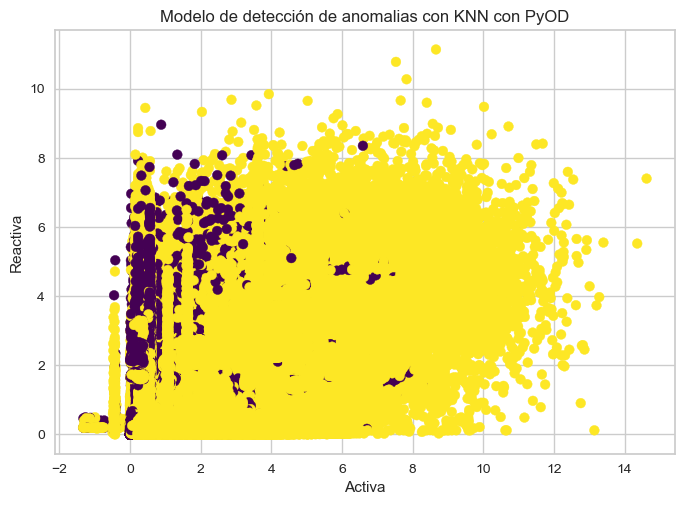

In [117]:
# Crear un modelo Isolation Forest para cada cliente
df = clientes[columnas]

for i in df.idCliente.unique():
    if i ==1:
        df2 = df[df.idCliente==i].copy()
        clf = KNN()
        clf.fit(df2)
        df2['cluster'] = clf.predict(df2)
        dfPyOD = df2.copy()
    else:
        df2 = df[df.idCliente==i].copy()
        clf = KNN()
        clf.fit(df2)
        df2['cluster'] = clfIF.predict(df2)
        dfPyOD = pd.concat([dfPyOD,df2])

dfPyOD['Fecha'] = clientes.Fecha2
dfPyOD['Activa'] = clientes.Active_energy
dfPyOD['Reactiva'] = clientes.Reactive_energy
# Visualizamos los resultados
plt.scatter(dfPyOD['Activa'], dfPyOD['Reactiva'], c=dfPyOD['cluster'], cmap='viridis')
plt.title('Modelo de detección de anomalias con KNN con PyOD')
plt.xlabel('Activa')
plt.ylabel('Reactiva')
plt.show()

In [91]:
dfPyOD.cluster.value_counts()

cluster
-1    337114
 1    108247
 0     18054
Name: count, dtype: int64

In [92]:
metrica1PyOD2, metrica2PyOD2 = metricasANS(dfPyOD['cluster'])
print('Davies-Bouldin Index: ' + str(metrica1PyOD2))
print('\nCalinski-Harabasz Index: ' + str(metrica2PyOD2))

Davies-Bouldin Index: 4.250916348965922

Calinski-Harabasz Index: 17571.21177168428


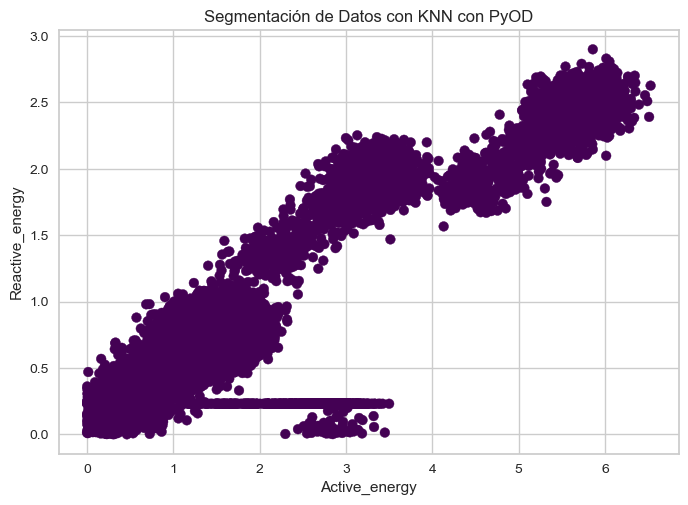

In [118]:
tempdf = dfPyOD[dfPyOD.cluster==0]
plt.scatter(tempdf['Activa'], tempdf['Reactiva'], c=tempdf['cluster'], cmap='viridis')
plt.title('Segmentación de Datos con KNN con PyOD')
plt.xlabel('Active_energy')
plt.ylabel('Reactive_energy')
plt.show()

# CONCLUSIÓN

Como se puede observar en los modelos realizados cuando se discrimina por usuario terminan con métricas inferiores a las vistas cuando se implementan los modelos sin discriminar por el cliente.
Ya realizando la revisión de los dos mejores modelos que capturaron los mejores patrones, encontramos que el modelo que mejor se comporta en encontrar el patrón en el Factor de la Potencia que se cálcula con la energía activa y reactiva, es la que nos permite saber si un cliente tiene un consumo anomalo.

In [120]:
dfKm['cluster2'].value_counts()

cluster2
0    404179
1     59236
Name: count, dtype: int64

In [121]:
clientes['cluster'] = dfKm['cluster2']
clientes

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,idCliente,Fecha2,Dia,Mes,Año,Hora,Minuto,Año_Mes,FactorPotencia,cluster
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,1,2021-01-01,1,1,2021,0,0,2021-01,0.784582,0
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,1,2021-01-01,1,1,2021,1,0,2021-01,0.653329,0
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,1,2021-01-01,1,1,2021,2,0,2021-01,0.951274,0
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,1,2021-01-01,1,1,2021,3,0,2021-01,0.752465,0
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,1,2021-01-01,1,1,2021,4,0,2021-01,0.916383,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11410,2022-04-21 10:00:00,0.960105,0.473234,1273.150602,1027.084539,30,2022-04-21,21,4,2022,10,0,2022-04,0.896961,0
11411,2022-04-21 11:00:00,0.624300,0.699936,1063.524968,1205.829819,30,2022-04-21,21,4,2022,11,0,2022-04,0.665634,0
11412,2022-04-21 12:00:00,0.985633,0.123560,1207.284283,1127.893714,30,2022-04-21,21,4,2022,12,0,2022-04,0.992234,0
11413,2022-04-21 13:00:00,0.710436,0.399262,1205.012971,1090.835898,30,2022-04-21,21,4,2022,13,0,2022-04,0.871763,0


In [124]:
clientes.to_csv('clustersModeloNoSupervisado.csv')